#Manipulating the data


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

#Visualizing the data

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib
import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot

#Dataprep library

In [ ]:
from dataprep.eda import *
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

#For Machine Learning Algorithms

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn import ensemble
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import metrics

#https://www.kaggle.com/c/covid19-global-forecasting-week-5/data

For downloading the datasets

#Loading the data

In [ ]:
df=pd.read_csv('train.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
test=pd.read_csv('test.csv')

In [ ]:
sub=pd.read_csv('submission.csv')

#Data analysis

In [ ]:
df

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0
...,...,...,...,...,...,...,...,...,...
969635,969636,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities,0
969636,969637,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases,27
969637,969638,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities,0
969638,969639,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases,6


In [ ]:
df.shape

(969640, 9)

In [ ]:
df.isnull().sum()

Id                    0
County            89600
Province_State    52360
Country_Region        0
Population            0
Weight                0
Date                  0
Target                0
TargetValue           0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 969640 entries, 0 to 969639
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              969640 non-null  int64  
 1   County          880040 non-null  object 
 2   Province_State  917280 non-null  object 
 3   Country_Region  969640 non-null  object 
 4   Population      969640 non-null  int64  
 5   Weight          969640 non-null  float64
 6   Date            969640 non-null  object 
 7   Target          969640 non-null  object 
 8   TargetValue     969640 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 66.6+ MB


In [ ]:
df.head()

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0


In [ ]:
fig = plt.figure(figsize = (45,30))
fig = px.pie(df, names = 'Country_Region', values = 'TargetValue', color_discrete_sequence = px.colors.sequential.RdBu, hole = 0.4)
fig.update_traces(textposition = 'inside')
fig.show()

<Figure size 3240x2160 with 0 Axes>

#Checking the data types in datasets

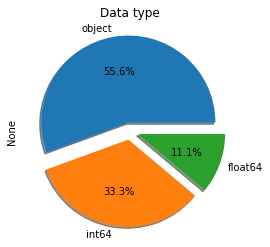

In [ ]:
df.dtypes.value_counts().plot.pie(explode=[0.1,0.1,0.1],autopct='%1.1f%%',shadow=True)
plt.title('Data type');

In [ ]:
df.describe(include='all')

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
count,969640.000000,880040,917280,969640,9.696400e+05,969640.000000,969640,969640,969640.000000
unique,NaN,1840,133,187,NaN,NaN,140,2,NaN
top,NaN,Washington,Texas,US,NaN,NaN,2020-04-07,ConfirmedCases,NaN
freq,NaN,8680,71400,895440,NaN,NaN,6926,484820,NaN
mean,484820.500000,NaN,NaN,NaN,2.720127e+06,0.530870,NaN,NaN,12.563518
std,279911.101847,NaN,NaN,NaN,3.477771e+07,0.451909,NaN,NaN,302.524795
min,1.000000,NaN,NaN,NaN,8.600000e+01,0.047491,NaN,NaN,-10034.000000
25%,242410.750000,NaN,NaN,NaN,1.213300e+04,0.096838,NaN,NaN,0.000000
50%,484820.500000,NaN,NaN,NaN,3.053100e+04,0.349413,NaN,NaN,0.000000
75%,727230.250000,NaN,NaN,NaN,1.056120e+05,0.968379,NaN,NaN,0.000000


#Finding the missing values

**In train data**

In [ ]:
missing = df.isnull().sum()
missing_percentage = df.isnull().sum()/df.shape[0]*100

dic = {
    'mising':missing,
    'missing_percentage %':missing_percentage
    }
frame=pd.DataFrame(dic)
frame

,mising,missing_percentage %
Id,0,0.000000
County,89600,9.240543
Province_State,52360,5.399942
Country_Region,0,0.000000
Population,0,0.000000
Weight,0,0.000000
Date,0,0.000000
Target,0,0.000000
TargetValue,0,0.000000


**In test data**

In [ ]:
missing = test.isnull().sum()
missing_percentage = test.isnull().sum()/df.shape[0]*100

dic = {
    'mising':missing,
    'missing_percentage %':missing_percentage
    }
frame=pd.DataFrame(dic)
frame

,mising,missing_percentage %
ForecastId,0,0.000000
County,28800,2.970174
Province_State,16830,1.735696
Country_Region,0,0.000000
Population,0,0.000000
Weight,0,0.000000
Date,0,0.000000
Target,0,0.000000


**In submission data**

In [ ]:
sub

,ForecastId_Quantile,TargetValue
0,1_0.05,1
1,1_0.5,1
2,1_0.95,1
3,2_0.05,1
4,2_0.5,1
...,...,...
935005,311669_0.5,1
935006,311669_0.95,1
935007,311670_0.05,1
935008,311670_0.5,1


#Data Visualization

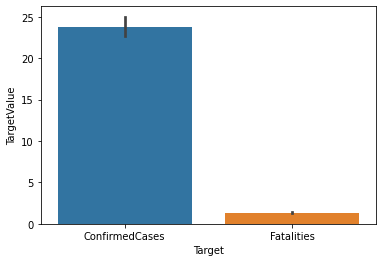

In [ ]:
sns.barplot(y = 'TargetValue', x='Target', data = df)
plt.show()

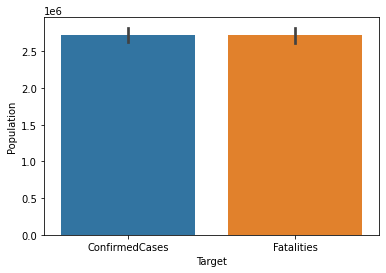

In [ ]:
sns.barplot(x = 'Target', y= 'Population', data = df)
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f5ac16f3c10>,
      dtype=object)

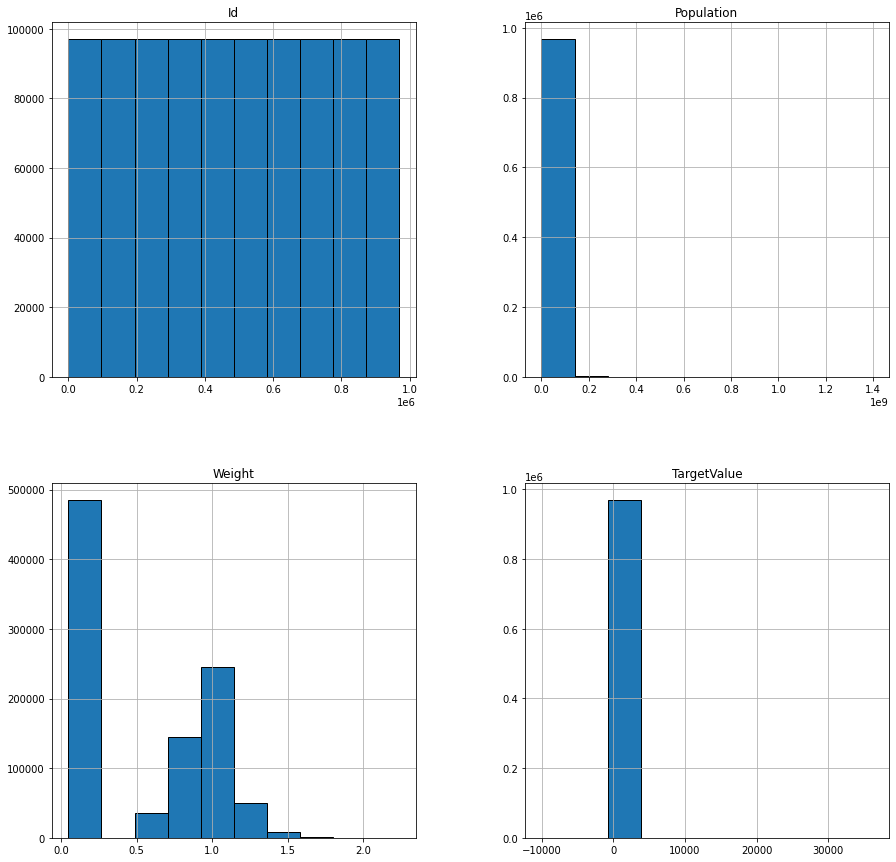

In [ ]:
df.hist(figsize=(15,15),edgecolor='black')

In [ ]:
grouped_data = df.groupby('Country_Region').sum()
top_10_pop_countries=grouped_data.nlargest(10, 'Population')['TargetValue']

In [ ]:
top_10_pop_countries

Country_Region
China          176564
India          284328
US            6317214
Indonesia       36275
Brazil         812096
Pakistan       115957
Nigeria         14255
Bangladesh      75877
Russia         499373
Japan           18066
Name: TargetValue, dtype: int64

In [ ]:
fig = px.bar(x = top_10_pop_countries.index, y = top_10_pop_countries.values, title='Top 10 most populous countries versus number of covid cases', labels = dict(x='Countries', y='Number of Covid-19 Cases'))
fig.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 969640 entries, 0 to 969639
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              969640 non-null  int64  
 1   County          880040 non-null  object 
 2   Province_State  917280 non-null  object 
 3   Country_Region  969640 non-null  object 
 4   Population      969640 non-null  int64  
 5   Weight          969640 non-null  float64
 6   Date            969640 non-null  object 
 7   Target          969640 non-null  object 
 8   TargetValue     969640 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 66.6+ MB


**County data**


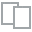
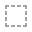
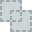
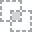
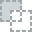
...
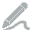
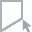
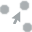
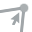
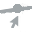

In [ ]:
plot(df.County)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



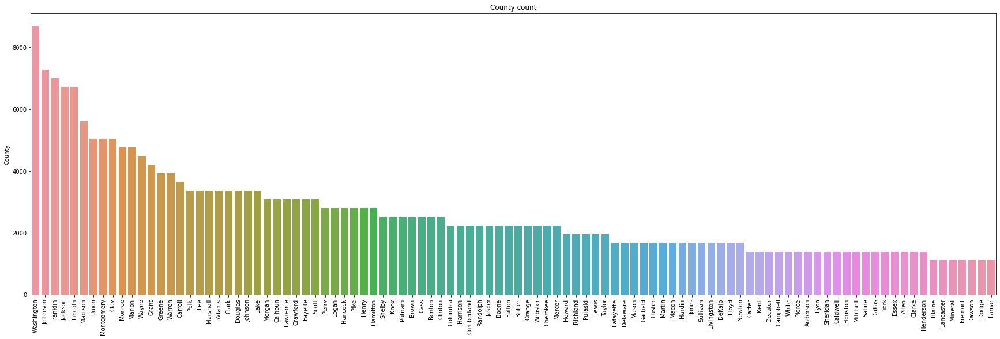

In [ ]:
plt.figure(figsize=(30,9))
county_plot=df.County.value_counts().head(100)
sns.barplot(county_plot.index,county_plot)
plt.xticks(rotation=90)
plt.title('County count');

**Province State**


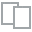
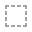
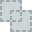
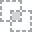
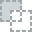
...
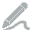
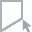
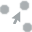
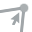
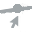

In [ ]:
plot(df.Province_State)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



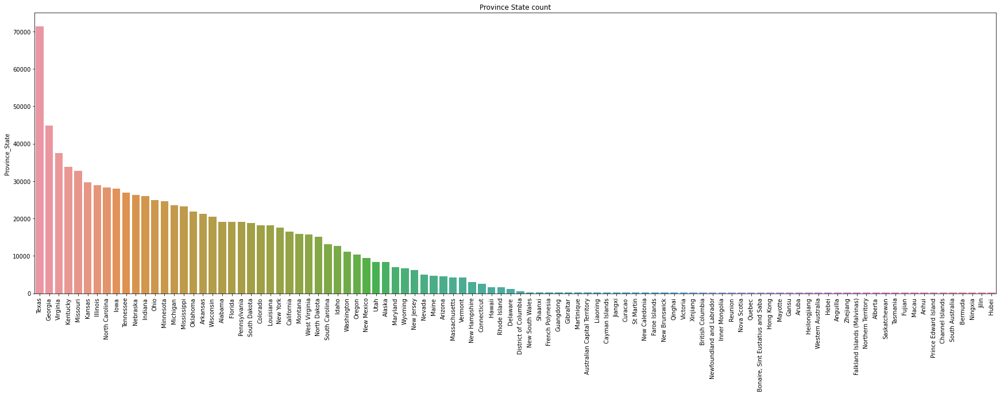

In [ ]:
plt.figure(figsize=(30,9))
Province_State_plot=df.Province_State.value_counts().head(100)
sns.barplot(Province_State_plot.index,Province_State_plot)
plt.xticks(rotation=90)
plt.title('Province State count');

**Country Region**


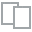
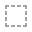
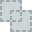
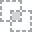
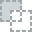
...
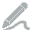
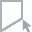
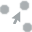
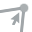
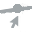

In [ ]:
plot(df.Country_Region)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



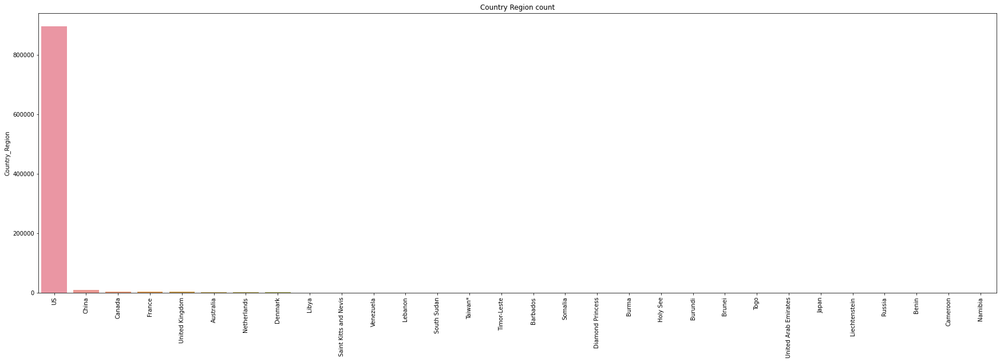

In [ ]:
plt.figure(figsize=(30,9))
Country_Region_plot=df.Country_Region.value_counts().head(30)
sns.barplot(Country_Region_plot.index,Country_Region_plot)
plt.xticks(rotation=90)
plt.title('Country Region count');

#Using Date for cases

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
test['Date'] = pd.to_datetime(test['Date'])

In [ ]:
date_grouped_data = df.groupby('Date').sum()
fig = px.line(x=date_grouped_data.index, y = date_grouped_data['TargetValue'], title = 'Growth of number of COVID-19 cases over time', labels = dict(x='Date', y = 'Number of Coivd-19 Cases'))
fig.show()

In [ ]:
last_date = df.Date.max()
df_countries = df[df['Date']==last_date]
df_countries = df_countries.groupby('Country_Region', as_index=False)['TargetValue'].sum()
df_countries = df_countries.nlargest(10,'TargetValue')
df_trend = df.groupby(['Date','Country_Region'], as_index=False)['TargetValue'].sum()
df_trend = df_trend.merge(df_countries, on='Country_Region')
df_trend.rename(columns={'Country_Region':'Country', 'TargetValue_x':'Cases'}, inplace=True)

In [ ]:
px.line(df_trend, x='Date', y='Cases', color='Country', title='COVID19 Total Cases growth for top 10 worst affected countries')

#Data preprocessing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 969640 entries, 0 to 969639
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Id              969640 non-null  int64         
 1   County          880040 non-null  object        
 2   Province_State  917280 non-null  object        
 3   Country_Region  969640 non-null  object        
 4   Population      969640 non-null  int64         
 5   Weight          969640 non-null  float64       
 6   Date            969640 non-null  datetime64[ns]
 7   Target          969640 non-null  object        
 8   TargetValue     969640 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 66.6+ MB


In [ ]:
df = df.drop(['County','Province_State','Country_Region','Target'],axis=1)
test = test.drop(['County','Province_State','Country_Region','Target'],axis=1)
df

,Id,Population,Weight,Date,TargetValue
0,1,27657145,0.058359,2020-01-23,0
1,2,27657145,0.583587,2020-01-23,0
2,3,27657145,0.058359,2020-01-24,0
3,4,27657145,0.583587,2020-01-24,0
4,5,27657145,0.058359,2020-01-25,0
...,...,...,...,...,...
969635,969636,14240168,0.607106,2020-06-08,0
969636,969637,14240168,0.060711,2020-06-09,27
969637,969638,14240168,0.607106,2020-06-09,0
969638,969639,14240168,0.060711,2020-06-10,6


In [ ]:
df.isnull().sum()

Id             0
Population     0
Weight         0
Date           0
TargetValue    0
dtype: int64

In [ ]:
def create_features(df):
    df['day'] = df['Date'].dt.day
    df['month'] = df['Date'].dt.month
    df['dayofweek'] = df['Date'].dt.dayofweek
    df['dayofyear'] = df['Date'].dt.dayofyear
    df['quarter'] = df['Date'].dt.quarter
    df['weekofyear'] = df['Date'].dt.weekofyear
    return df

In [ ]:
def train_dev_split(df, days):
    date = df['Date'].max() - dt.timedelta(days=days)
    return df[df['Date'] <= date], df[df['Date'] > date]

In [ ]:
test_date_min = test['Date'].min()
test_date_max = test['Date'].max()

In [ ]:
def avoid_data_leakage(df, date=test_date_min):
    return df[df['Date']<date]

In [ ]:
def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day
df['Date']=pd.to_datetime(df['Date'])
test['Date']=pd.to_datetime(test['Date'])

In [ ]:
test['Date']=test['Date'].dt.strftime("%Y%m%d")
df['Date']=df['Date'].dt.strftime("%Y%m%d").astype(int)

**split data**

In [ ]:
predictors = df.drop(['TargetValue', 'Id'], axis=1)
target = df["TargetValue"]
X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size = 0.22, random_state = 0)

#RandomForestRegression

In [ ]:
model = RandomForestRegressor(n_jobs=-1)
estimators = 100
model.set_params(n_estimators=estimators)

scores = []

pipeline = Pipeline([('scaler2' , StandardScaler()),('RandomForestRegressor: ', model)])
pipeline.fit(X_train , y_train)
prediction = pipeline.predict(X_test)

pipeline.fit(X_train, y_train)
scores.append(pipeline.score(X_test, y_test))

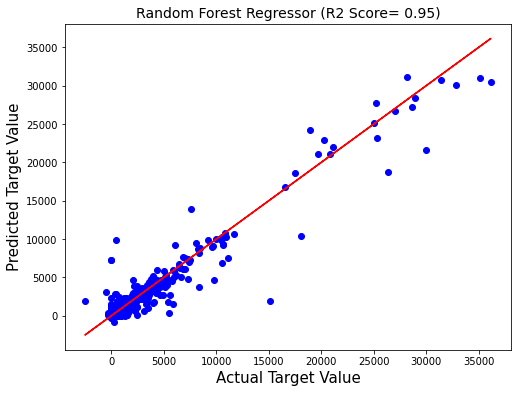

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(y_test,y_test,color='red')
plt.scatter(y_test,prediction,color='blue')
plt.xlabel('Actual Target Value',fontsize=15)
plt.ylabel('Predicted Target Value',fontsize=15)
plt.title('Random Forest Regressor (R2 Score= 0.95)',fontsize=14)
plt.show()

In [ ]:
X_test

,Population,Weight,Date
26202,85026000,0.054769,20200413
61887,5426252,0.644880,20200126
397665,21096,1.004330,20200224
239494,6578,0.113744,20200310
78826,32924,0.096135,20200405
...,...,...,...
732731,66618,0.900354,20200527
845569,3265,1.235892,20200526
72149,52342,0.920338,20200426
514861,10309,1.082149,20200512


In [ ]:
test.drop(['ForecastId'],axis=1,inplace=True)
test.index.name = 'Id'
test

,Population,Weight,Date
Id,,,
0,27657145,0.058359,20200427
1,27657145,0.583587,20200427
2,27657145,0.058359,20200428
3,27657145,0.583587,20200428
4,27657145,0.058359,20200429
...,...,...,...
311665,14240168,0.607106,20200608
311666,14240168,0.060711,20200609
311667,14240168,0.607106,20200609


In [ ]:
y_pred2 = pipeline.predict(X_test)
y_pred2

array([9.82, 0.  , 0.  , ..., 0.  , 0.  , 0.  ])

In [ ]:
predictions = pipeline.predict(test)
pred_list = [int(x) for x in predictions]
output = pd.DataFrame({'Id': test.index, 'TargetValue': pred_list})
print(output)

            Id  TargetValue
0            0           78
1            1            5
2            2          122
3            3            2
4            4          107
...        ...          ...
311665  311665            0
311666  311666           21
311667  311667            0
311668  311668           12
311669  311669            0

[311670 rows x 2 columns]


#XG booster regression

> Indented block



In [ ]:
import xgboost as xgb

In [ ]:
xgbr= xgb.XGBRegressor(n_estimators=800, learning_rate=0.01, gamma=0, subsample=.7,
                       colsample_bytree=.7, max_depth=10,
                       min_child_weight=0, 
                       objective='reg:squarederror', nthread=-1, scale_pos_weight=1,
                       seed=27, reg_alpha=0.00006, n_jobs=-1)

In [ ]:
xgbr.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.01, max_delta_step=0,
             max_depth=10, min_child_weight=0, missing=None, n_estimators=800,
             n_jobs=-1, nthread=-1, objective='reg:squarederror',
             random_state=0, reg_alpha=6e-05, reg_lambda=1, scale_pos_weight=1,
             seed=27, silent=None, subsample=0.7, verbosity=1)

In [ ]:
prediction_xgbr=xgbr.predict(X_test)

In [ ]:
print('RMSE_XGBoost Regression=', np.sqrt(metrics.mean_squared_error(y_test,prediction_xgbr)))
print('R2 Score_XGBoost Regression=',metrics.r2_score(y_test,prediction_xgbr))

RMSE_XGBoost Regression= 81.68933288838252
R2 Score_XGBoost Regression= 0.9283543943463183


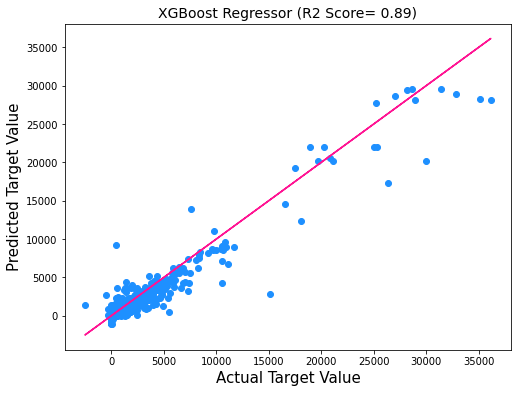

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=prediction_xgbr, color='dodgerblue')
plt.plot(y_test,y_test, color='deeppink')
plt.xlabel('Actual Target Value',fontsize=15)
plt.ylabel('Predicted Target Value',fontsize=15)
plt.title('XGBoost Regressor (R2 Score= 0.89)',fontsize=14)
plt.show()

In [ ]:
a=output.groupby(['Id'])['TargetValue'].quantile(q=0.05).reset_index()
b=output.groupby(['Id'])['TargetValue'].quantile(q=0.5).reset_index()
c=output.groupby(['Id'])['TargetValue'].quantile(q=0.95).reset_index()
a.columns=['Id','q0.05']
b.columns=['Id','q0.5']
c.columns=['Id','q0.95']
a=pd.concat([a,b['q0.5'],c['q0.95']],1)
a['q0.05']=a['q0.05'].clip(0,10000)
a['q0.5']=a['q0.5'].clip(0,10000)
a['q0.95']=a['q0.95'].clip(0,10000)
a['Id'] =a['Id']+ 1
a

,Id,q0.05,q0.5,q0.95
0,1,78.0,78.0,78.0
1,2,5.0,5.0,5.0
2,3,122.0,122.0,122.0
3,4,2.0,2.0,2.0
4,5,107.0,107.0,107.0
...,...,...,...,...
311665,311666,0.0,0.0,0.0
311666,311667,21.0,21.0,21.0
311667,311668,0.0,0.0,0.0
311668,311669,12.0,12.0,12.0


In [ ]:
sub=pd.melt(a, id_vars=['Id'], value_vars=['q0.05','q0.5','q0.95'])
sub['variable']=sub['variable'].str.replace("q","", regex=False)
sub['ForecastId_Quantile']=sub['Id'].astype(str)+'_'+sub['variable']
sub['TargetValue']=sub['value']
sub=sub[['ForecastId_Quantile','TargetValue']]
sub.reset_index(drop=True,inplace=True)
sub.head()

,ForecastId_Quantile,TargetValue
0,1_0.05,78.0
1,2_0.05,5.0
2,3_0.05,122.0
3,4_0.05,2.0
4,5_0.05,107.0


In [ ]:
sub.to_csv("submission.csv",index=False)